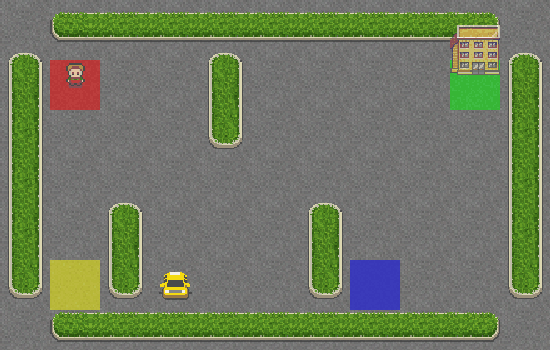

In [3]:
import gymnasium as gym
import numpy as np
import matplotlib.pyplot as plt
import math
from IPython.display import Image
from tqdm import tqdm

env = gym.make("Taxi-v3")
Image(filename=r'C:\Users\Lenovo\Desktop\uniowo\7mo semestre\SIS420\labs\lab7\taxi.gif')


Vamos a crear el entorno env usando la librería de Gymnasium e importando el juego Taxi-v3

## Estados
Posición del taxi (fila y columna → 5x5 = 25 posiciones). 25

Ubicación del pasajero (Cuadrícula Roja, Cuadrícula Verde, Cuadrícula Amarilla, Cuadrícula Azul o "Dentro del taxi"). 5

Destino del pasajero (una de las cuatro cuadrículas). 4
La combinación de estos 3 nos da una cantidad de 500 estados posibles 25 x 5 x 4 = 500

## Movimientos
El taxi puede ejecutar 6 acciones:

- Moverse al sur

- Moverse al norte

- Moverse al este

- Moverse al oeste

- Recoger pasajero

- Dejar pasajero

## Recompensas
- Cada paso penaliza con -1, para motivar soluciones rápidas.

- Intentar recoger/dejar pasajero en el lugar incorrecto: penalización de -10.

- Entregar correctamente al pasajero: +20 de recompensa.

- El juego acaba cuando el taxi deja al pasajero en el lugar correcto. 

## Entrenamiento del agente

- Algoritmos de Gradientes

In [4]:
n_episodios = 5000
max_steps = 200
alphas = [0.1, 0.4, 0.6, 0.8, 1.0]
gamma = 0.99

num_states = env.observation_space.n
num_actions = env.action_space.n

recompensas_medias = np.zeros((len(alphas), n_episodios))
acciones_optimas = np.zeros((len(alphas), n_episodios))

Realizaremos la inicialización de hiperparámetros manejando un número de 5000 partidas y 200 pasos, con estos 200 pasos nos aseguraremos de que nuestro modelo no entre en una partida infinita durante una partida y llegue a perjudicar el entrenamiento, usaremos también una variable Gamma de 0.99 con el fin de explorar las acciones futuras al tener recompensas negativas en cada estado de movimiento del taxi es probable que no vea un sentido bueno para ningún movimiento y perjudique de igual forma al entrenamiento.

In [5]:
def softmax(x):
    x = x - np.max(x)
    e_x = np.exp(x)
    return e_x / e_x.sum()

Con la función Softmax convertiremos nuestras preferencias en probabilidades para nuestra tabla y el agente se guie en base a estas probabilidades para su desempeño como lo describe el método de algiritmos de gradientes.

In [6]:
n_episodes = 5000
max_steps = 200
alphas = [0.1, 0.4, 0.6, 0.8, 1.0]

num_states = env.observation_space.n
num_actions = env.action_space.n

Realizamos la inicialización con 5 distintas alphas para observar mejor el desempeño del método.

In [7]:
for alpha in alphas:
    H = np.random.normal(0, 0.01, (num_states, num_actions))
    recompensas = []
    baseline = 0

    for _ in tqdm(range(n_episodes), desc=f"Alpha {alpha}"):
        state, _ = env.reset()
        total_reward = 0

        for _ in range(max_steps):
            pi = softmax(H[state])
            action = np.random.choice(np.arange(num_actions), p=pi)
            next_state, reward, terminated, truncated, _ = env.step(action)
            done = terminated or truncated
            total_reward += reward

            baseline += 0.01 * (reward - baseline)
            for a in range(num_actions):
                if a == action:
                    H[state][a] += alpha * (reward - baseline) * (1 - pi[a])
                else:
                    H[state][a] -= alpha * (reward - baseline) * pi[a]

            state = next_state
            if done:
                break

        recompensas.append(total_reward)

    promedio = np.mean(recompensas)
    print(f"Alpha: {alpha}, Recompensa promedio: {promedio}")

Alpha 0.1: 100%|██████████| 5000/5000 [00:23<00:00, 212.01it/s]


Alpha: 0.1, Recompensa promedio: -203.152


Alpha 0.4: 100%|██████████| 5000/5000 [00:22<00:00, 219.49it/s]


Alpha: 0.4, Recompensa promedio: -201.3924


Alpha 0.6: 100%|██████████| 5000/5000 [00:22<00:00, 222.09it/s]


Alpha: 0.6, Recompensa promedio: -200.504


Alpha 0.8: 100%|██████████| 5000/5000 [00:22<00:00, 219.85it/s]


Alpha: 0.8, Recompensa promedio: -201.0348


Alpha 1.0: 100%|██████████| 5000/5000 [00:22<00:00, 223.00it/s]

Alpha: 1.0, Recompensa promedio: -201.256


En este método vamos a usar preferencias H que serán convertidas en probabilidades para el desarrollo del agente dentro del juego, la lógica del algoritmo es que a medida que una acción nos de buenos resultados vamos a aumentar su preferencia y porcentaje para luego disminuir la del resto de las acciones en ese estado, también en caso de que nos de una recompensa menor a la del promedio vamos a disminuir la preferencia de esa acción y subir la de las otras acciones, la variable baseline serpa nuestro promedio móvil de recompensas que ayudará a reducir la varianza del gradiente, vamos a inicializar las preferencias en valores cercanos a cero para forzar un poco más la exploración inicial, la variaable baseline se actualizará usando un promedio exponencial.

Podemos observar que pese a la cantidad de alphas el método simplemente no llega a un buen entrenamiento. Esto puede debeserse a la lógica del juego donde cada acción penaliza al agente a menos que llegue al final dejando al pasajero en su destino y obteniendo la recompensa de +20, esto provoca que el aprendizaje sea débil especialmente si el agente no llega al destino mediante la exploración, el gradiente necesita recompensas más frecuentes o una señal que sea clara para su correcto ajuste, este juego al tener un alto espacio de estados, recompensas tardías y una necesidad alta de exploración provoca que el método de gradientes no funcione correctamente.

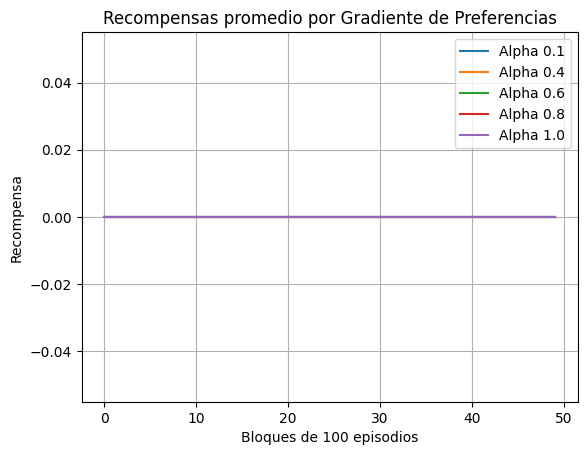

In [8]:
def suavizar(lista, bloque=100):
    return [np.mean(lista[i:i + bloque]) for i in range(0, len(lista), bloque)]

for i, alpha in enumerate(alphas):
    plt.plot(suavizar(recompensas_medias[i]), label=f"Alpha {alpha}")
plt.title("Recompensas promedio por Gradiente de Preferencias")
plt.xlabel("Bloques de 100 episodios")
plt.ylabel("Recompensa")
plt.legend()
plt.grid(True)


En estas gráficas podemos observar que el agente si bien va aprendiendo a disminuir la pérdidad llega un punto donde se estanca en -200 o -190 aproximadamente mostrando que en todos los juegos el agente nunca llegó a completar su tarea.